In [2]:
using  LinearAlgebra, Plots, DifferentialEquations; gr()
include("IntegratorTools.jl");

In [11]:
function ExactPendulum(u₀,h,N)
function f!(du,u,params,t)
     - sin(u) # u'' = -sin(u)
end

p0 = u₀[2];
q0 = u₀[1];
        
tspan = (0.0,h*N)
prob = SecondOrderODEProblem(f!,p0,q0,tspan)
sol = solve(prob,KahanLi8(), dt=1//100)

return stack(sol, dims=2)[end:-1:1,:]

end

ExactPendulum (generic function with 1 method)

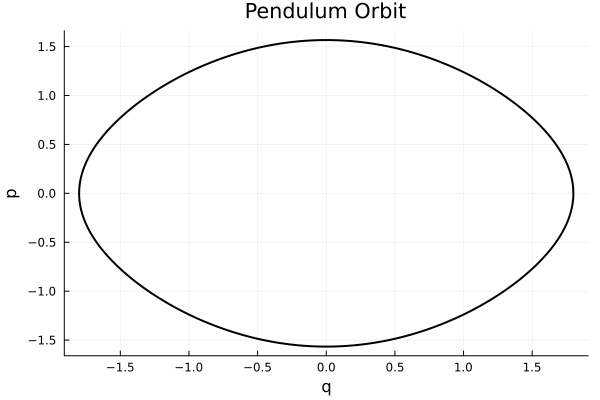

In [12]:
h = 1//100; N=1000; u0 = [1.8;0.0];    
uExact = ExactPendulum(u0,h,N);    
plot(uExact[1,:],uExact[2,:],xlabel = "q", ylabel = "p",lw=2,lc=:black,title = "Pendulum Orbit",legend = false)

In [59]:
function  fPendulum(y)
Ydot = [y[2], -sin(y[1])];
  return Ydot
end

function fPendulumT(p)
    
return Qdot = [p[1]];

end

function fPendulumV(q)
     
return Pdot = [- sin(q[1])];
    
end

fPendulumV (generic function with 1 method)

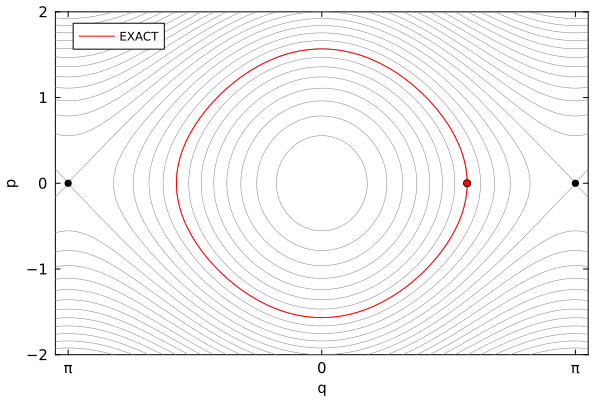

In [6]:
function plot_phase_portrait(uExact)  
V(x,y) = 0.5*y^2 - cos(x)
x = range(-3.3,3.3,100)
y = range(-2,2,100)
contour(x,y, (x,y)->V(x,y),color=[:gray] ,levels=25, lw=0.5,grid=:false,widen=false,colorbar_entry=false,framestyle = :box,)
plot!(uExact[1,:],uExact[2,:],lc=:red,lw=1,label="EXACT")
xticks!([-π,0,π], ["π","0", "π"])
xlabel!("q")
ylabel!("p")
plot!(xtickfontsize=10,ytickfontsize=10,xguidefontsize=10,yguidefontsize=10)
scatter!([-π], [0], color = "black",label="", markersize = 4)
scatter!([π], [0], color = "black",label="",  markersize = 4)
scatter!([1.8], [0], color = "red", label = "", markersize = 4)
end

plot_phase_portrait(uExact)  

In [7]:
function SmileFace(u0;R=0.4)
step=π / 2000;    
t=0:step:2*π; n=length(t) ; a = 0.1;
    
y= hcat(u0[1] .+ R*cos.(t),u0[2] .+R*sin.(t)) # big circle of radius
y1=hcat(u0[1] -a  .+ R/8*cos.(t),u0[2] + 0.15 .+ R/5*sin.(t))  # left small circle
y2=hcat(u0[1] +a  .+ R/8*cos.(t),u0[2] + 0.15 .+ R/5*sin.(t))  # right small circle

a =0.3    
t = range(u0[1]+a, u0[1]-a, 400)

y3= hcat(t, 3.5*R*(t .-u0[1]).^2 .+ u0[2] .- 0.2) #  parabola

    
Y = [y; NaN NaN; y1; NaN NaN; y2; NaN NaN; y3]
     return Y, size(Y,1);
end

SmileFace (generic function with 1 method)

In [60]:
function DiskArea(u0,h,N;flag=0)

Y,n =  SmileFace(u0);   
    
step=π / 2000;t=0:step:2*π; n1=length(t)


area = zeros(2,n);


q0 = Y[:,1]; p0 = Y[:,2];

if flag==0
     for i=1:n
            y0 = [q0[i] , p0[i]];
         area[:,i]  = ExactPendulum(y0,h,N)[:,end]       
     end   
      
elseif flag==1
        
    for i=1:n
      y0 = [q0[i] , p0[i]];
      area[:,i]  = ExpEuler(fPendulum,y0,h,N)[:,end]
    end 
        
elseif flag==2
        
        for i=1:n
           y0 = [q0[i] , p0[i]];
          area[:,i]  = ImpEuler(fPendulum,y0,h,N)[:,end]             
       end 

elseif flag==3
        
        for i=1:n
           y0 = [q0[i] , p0[i]];
          area[:,i]  = SympEuler(fPendulumT,fPendulumV,[y0[1]],[y0[2]],h,N)[:,end]             
       end 

elseif flag==4
        
        for i=1:n
           y0 = [q0[i] , p0[i]];
          area[:,i]  = MidPoint(fPendulum,y0,h,N)[:,end]             
       end 

elseif flag==6
        
        for i=1:n
           y0 = [q0[i] , p0[i]];
          area[:,i]  = StormerVerlet(fPendulumT,fPendulumV,[y0[1]],[y0[2]],h,N)[:,end]             
       end         

elseif flag==8
        for i=1:n
           y0 = [q0[i] , p0[i]];
          area[:,i]  = Runge(fPendulum,y0,h,N)[:,end]        
       end      
end
    
return  area, n1;
end



function plot_area(u0, h, nIter;method,title)
V(x,y) = 0.5*y^2 - cos(x);
x = range(-5,5,100);
y = range(-2,2,100);

    
p = contour(x,y, (x,y)->V(x,y),color=[:gray] ,levels=35, lw=0.5,grid=:false,widen=false,legend=false,framestyle = :box)

for N in n_iter        
exact, n = DiskArea(u0,h,N);
        
plot!(p,exact[1,1:n],exact[2,1:n],fc=:white,lc=:black,fill=true,lw=1);
plot!(p,exact[1,n+1:3*n],exact[2,n+1:3*n],fc=:black,lc=:black,fill=true,lw=1);     
plot!(p,exact[1,3*n+2:end],exact[2,3*n+2:end],lc=:black,lw = 2,fill=false);
end

for N in n_iter        
A,n = DiskArea(u0,h,N, flag = method);
plot!(A[1,1:n],A[2,1:n],fc=:gray,lc=:black,fill=true,lw=1);
plot!(A[1,n+1:3*n],A[2,n+1:3*n],fc=:black,lc=:black,fill=true);     
plot!(A[1,3*n+2:end],A[2,3*n+2:end],lc=:black,lw = 2,fill=false);
end    

title!(title)
xticks!([-π,0,π], ["-π","0", "π"])
xlims!(-5,5);
ylims!(-2,2);    
end

plot_area (generic function with 2 methods)

┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability detected. Aborting
└ @ SciMLBase ~/.julia/packages/SciMLBase/dHarz/src/integrator_interface.jl:608
┌ Warning: Instability d

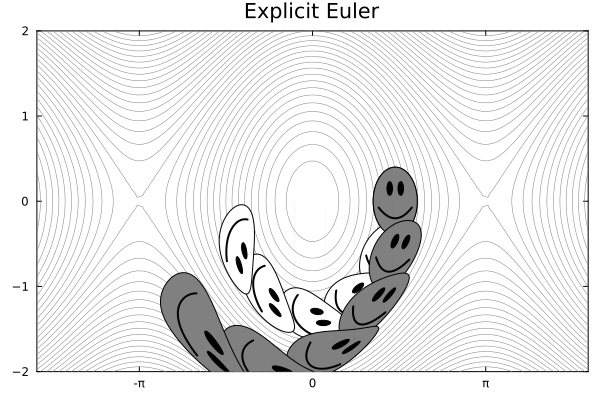

In [62]:
u0 = [1.5;0.0]
h = π / 5;

nIter = [0,1,2,3,4,5]

plot_area(u0, h, nIter,method=1,title="Explicit Euler")